
###*Pontificia Universidad Javeriana*

**Fecha**: 2 de octubre 2024

**Profesor**: John Corredor, PhD

**Materia**: Procesamiento de Alto Volumen de Datos

**Objetivo**: Segundo Parcial **Modelo A**

###**Nombre Estudiante**: Daniela Florez Villamil

###**ID Estudiante**: 20432482

**Contexto**
- Se presenta un conjunto de datos (dataset) los cuales representan las ventas de productos en el año 2019
- Cada dataset tiene los siguientes campos
     
      - ID Orden: identificador de orden de compra
     
      - Producto: Descripción de producto
     
      - Cantidad Ordenada: cantidad de productos del mismo tipo ordenados/pedidos/comprados
     
      - Precio Unitarios: valor comercial del producto
     
      - Fecha: fecha del producto vendido, formato: mes/día/año hora
     
      - Dirección de compra: dirección de venta del producto, formato: dirección, ciudad, iniciales del departamento

- El conjunto de datos se ubica en la carpeta del [enlace](<https://github.com/corredor-john/ExploratoryDataAnalisys/tree/main/Ventas>)
- A continuación de se presenta los pasos a seguir a para el desarrollo del parcial

##1. Cargar las bibliotecas necesarias y la sesión PYSPARK
### Puse pretytable para poner la tabla de estadisticos mas estetica

In [0]:
pip install prettytable


Python interpreter will be restarted.
Python interpreter will be restarted.


In [0]:
###Importacion de librerias
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import random

from pyspark import SparkFiles
from pyspark.sql import SparkSession
from pyspark.ml import Pipeline
from pyspark.sql import SQLContext
from pyspark.sql.session import SparkSession
from pyspark.sql.types import IntegerType, FloatType, DoubleType, StringType
from pyspark.sql.functions import mean, col, split, when, isnan, count, udf, lit, to_date, concat, split, desc, month
from pyspark.ml.feature import StringIndexer, VectorAssembler

##2. DataFrame PySpark (10 pts)
####2.1.- Crear un dataframe PySpark con los conjuntos de datos de la carpeta dada en el enlace

In [0]:

# URL del archivo CSV
url = "https://raw.githubusercontent.com/corredor-john/ExploratoryDataAnalisys/refs/heads/main/Ventas/Ventas_December_2019.csv"

# Agregar el archivo al contexto de Spark
spark.sparkContext.addFile(url)


In [0]:
# Obtener la ruta del archivo agregado
path = SparkFiles.get("Ventas_December_2019.csv")

# Leer el archivo CSV en un DataFrame
DFVentas = spark.read.csv("file://"+ path, inferSchema = True, header = True, sep = ",")

##Inspecciona el data set
display(DFVentas)


ID Orden,Producto,Cantidad Ordenada,Precio Unitario,Fecha,Dirección de Compra
276339,Audifonos Bose SoundSport,1,399900,12/11/19 19:29,"345 calle Pte Aranda, Neiva, HU"
276340,Multiolla Oster 0150 Negra PE,1,299900,12/13/19 16:56,"924 calle Americas, Manizalez, CA"
276341,Samsung Galaxy A302,1,649900,12/12/19 06:05,"616 calle Sunset, Medellin, AN"
276342,Cable de Carga Lightning,1,64900,12/23/19 21:22,"189 calle Willow, Medellin, AN"
276343,Audifonos Bose SoundSport,1,399900,12/20/19 15:36,"931 calle Madison, Bogotá, CU"
276344,Freidora Air Fryer Kalley K-MAF25,1,198849,12/12/19 16:09,"421 calle Americas, Barranquilla, AT"
276345,Horno Microondas 0.8P Samsung AGE,1,309900,12/21/19 14:52,"981 calle Cedar, Bogotá, CU"
276345,Audifonos Apple Airpods,1,499900,12/21/19 14:52,"981 calle Cedar, Bogotá, CU"
276346,Cable de Carga USB-C P/O,1,46900,12/01/19 12:31,"954 calle Santa, Medellin, AN"
276347,Freidora Saludable B&D 3.5 Litros,1,229900,12/29/19 20:30,"776 calle Avenida, Cúcuta, NS"


####2.2.- Presentar el tipo de datos del dataframe spark (5 pts)

In [0]:
## Inspección del dataset
DFVentas.columns

Out[4]: ['ID Orden',
 'Producto ',
 ' Cantidad Ordenada',
 'Precio Unitario ',
 'Fecha',
 'Dirección de Compra']

In [0]:
#Revisar tipos de datos
DFVentas.printSchema()

root
 |-- ID Orden: integer (nullable = true)
 |-- Producto : string (nullable = true)
 |--  Cantidad Ordenada: integer (nullable = true)
 |-- Precio Unitario : integer (nullable = true)
 |-- Fecha: string (nullable = true)
 |-- Dirección de Compra: string (nullable = true)



####2.3.-Se requiere cambiar los nombres de las columnas: (3 pts)
  - 'Producto '->'Producto'
  - ' Cantidad Ordenada'->'Cantidad'
  - 'Precio Unitario '->'Precio_Unitario'

In [0]:
##Cambiar nombres de las columnas

# Renombrar las columnas
DFVentas01 = DFVentas \
    .withColumnRenamed("Producto ", "Producto") \
    .withColumnRenamed(" Cantidad Ordenada", "Cantidad") \
    .withColumnRenamed("Precio Unitario ", "Precio_Unitario")

# Mostrar el esquema actualizado
DFVentas01.printSchema()


root
 |-- ID Orden: integer (nullable = true)
 |-- Producto: string (nullable = true)
 |-- Cantidad: integer (nullable = true)
 |-- Precio_Unitario: integer (nullable = true)
 |-- Fecha: string (nullable = true)
 |-- Dirección de Compra: string (nullable = true)



In [0]:
##Inspecciona el data set
display(DFVentas01)

ID Orden,Producto,Cantidad,Precio_Unitario,Fecha,Dirección de Compra
276339,Audifonos Bose SoundSport,1,399900,12/11/19 19:29,"345 calle Pte Aranda, Neiva, HU"
276340,Multiolla Oster 0150 Negra PE,1,299900,12/13/19 16:56,"924 calle Americas, Manizalez, CA"
276341,Samsung Galaxy A302,1,649900,12/12/19 06:05,"616 calle Sunset, Medellin, AN"
276342,Cable de Carga Lightning,1,64900,12/23/19 21:22,"189 calle Willow, Medellin, AN"
276343,Audifonos Bose SoundSport,1,399900,12/20/19 15:36,"931 calle Madison, Bogotá, CU"
276344,Freidora Air Fryer Kalley K-MAF25,1,198849,12/12/19 16:09,"421 calle Americas, Barranquilla, AT"
276345,Horno Microondas 0.8P Samsung AGE,1,309900,12/21/19 14:52,"981 calle Cedar, Bogotá, CU"
276345,Audifonos Apple Airpods,1,499900,12/21/19 14:52,"981 calle Cedar, Bogotá, CU"
276346,Cable de Carga USB-C P/O,1,46900,12/01/19 12:31,"954 calle Santa, Medellin, AN"
276347,Freidora Saludable B&D 3.5 Litros,1,229900,12/29/19 20:30,"776 calle Avenida, Cúcuta, NS"


####2.4.- Convertir las columnas requeridas a los tipos de datos correspondientes (2 pts)

In [0]:

### Castear columna Cantidad 
DFVentas01 = DFVentas01.withColumn("Cantidad", col("Cantidad").cast("integer")).withColumn("Fecha", to_date(col("Fecha"), "MM/dd/yy HH:mm")) 

### Mostrar Datos
DFVentas01.printSchema()


root
 |-- ID Orden: integer (nullable = true)
 |-- Producto: string (nullable = true)
 |-- Cantidad: integer (nullable = true)
 |-- Precio_Unitario: integer (nullable = true)
 |-- Fecha: date (nullable = true)
 |-- Dirección de Compra: string (nullable = true)



In [0]:
##Inspecciona el data set
display(DFVentas01)


ID Orden,Producto,Cantidad,Precio_Unitario,Fecha,Dirección de Compra
276339,Audifonos Bose SoundSport,1,399900,2019-12-11,"345 calle Pte Aranda, Neiva, HU"
276340,Multiolla Oster 0150 Negra PE,1,299900,2019-12-13,"924 calle Americas, Manizalez, CA"
276341,Samsung Galaxy A302,1,649900,2019-12-12,"616 calle Sunset, Medellin, AN"
276342,Cable de Carga Lightning,1,64900,2019-12-23,"189 calle Willow, Medellin, AN"
276343,Audifonos Bose SoundSport,1,399900,2019-12-20,"931 calle Madison, Bogotá, CU"
276344,Freidora Air Fryer Kalley K-MAF25,1,198849,2019-12-12,"421 calle Americas, Barranquilla, AT"
276345,Horno Microondas 0.8P Samsung AGE,1,309900,2019-12-21,"981 calle Cedar, Bogotá, CU"
276345,Audifonos Apple Airpods,1,499900,2019-12-21,"981 calle Cedar, Bogotá, CU"
276346,Cable de Carga USB-C P/O,1,46900,2019-12-01,"954 calle Santa, Medellin, AN"
276347,Freidora Saludable B&D 3.5 Litros,1,229900,2019-12-29,"776 calle Avenida, Cúcuta, NS"


##3.- Creación de variables: derivación de variables *(20pts)*

####3.1.-Se requiere Crear nueva columna **Mes** a partir de la columna *Fecha* (5 pts)

In [0]:

# Crear la nueva columna 'Mes' a partir de la columna 'Fecha'
DFVentas02 = DFVentas01.withColumn("Mes", month(col("Fecha")))

# Mostrar el DataFrame actualizado
DFVentas02.printSchema()

root
 |-- ID Orden: integer (nullable = true)
 |-- Producto: string (nullable = true)
 |-- Cantidad: integer (nullable = true)
 |-- Precio_Unitario: integer (nullable = true)
 |-- Fecha: date (nullable = true)
 |-- Dirección de Compra: string (nullable = true)
 |-- Mes: integer (nullable = true)



####3.2.-Se requiere Crear 3 nuevas columnas (**Dirección**, **Ciudad**, **Departamento**) a partir de la columna *Dirección de Compra* (5 pts)

In [0]:
# Dividir la columna 'Dirección de Compra' en 3 partes
DFVentas02 = DFVentas02.withColumn("Dirección", split(col("Dirección de Compra"), ",").getItem(0)) \
       .withColumn("Ciudad", split(col("Dirección de Compra"), ",").getItem(1)) \
       .withColumn("Departamento", split(col("Dirección de Compra"), ",").getItem(2))

# Mostraras el DataFrame actualizado
DFVentas02.printSchema()

root
 |-- ID Orden: integer (nullable = true)
 |-- Producto: string (nullable = true)
 |-- Cantidad: integer (nullable = true)
 |-- Precio_Unitario: integer (nullable = true)
 |-- Fecha: date (nullable = true)
 |-- Dirección de Compra: string (nullable = true)
 |-- Mes: integer (nullable = true)
 |-- Dirección: string (nullable = true)
 |-- Ciudad: string (nullable = true)
 |-- Departamento: string (nullable = true)



####3.3.-Se requiere crear una nueva columna 'Ciudad(Departamento)', a partir de las columnas Ciudad y Departamento (5 pts)

In [0]:
# Crear columna 'Ciudad(Departamento)'
DFVentas03 = DFVentas02.withColumn("Ciudad(Departamento)", concat(col("Ciudad"), lit("("), col("Departamento"), lit(")")))

DFVentas03.printSchema()

root
 |-- ID Orden: integer (nullable = true)
 |-- Producto: string (nullable = true)
 |-- Cantidad: integer (nullable = true)
 |-- Precio_Unitario: integer (nullable = true)
 |-- Fecha: date (nullable = true)
 |-- Dirección de Compra: string (nullable = true)
 |-- Mes: integer (nullable = true)
 |-- Dirección: string (nullable = true)
 |-- Ciudad: string (nullable = true)
 |-- Departamento: string (nullable = true)
 |-- Ciudad(Departamento): string (nullable = true)



####3.4.- Eliminar las columnas: 'Dirección de Compra', 'Ciudad', 'Departamento' (5 pts)

In [0]:
# Eliminar las columnas 'Dirección de Compra', 'Ciudad', y 'Departamento'
DFVentas03 = DFVentas03.drop("Dirección de Compra", "Ciudad", "Departamento")

DFVentas03.printSchema()

root
 |-- ID Orden: integer (nullable = true)
 |-- Producto: string (nullable = true)
 |-- Cantidad: integer (nullable = true)
 |-- Precio_Unitario: integer (nullable = true)
 |-- Fecha: date (nullable = true)
 |-- Mes: integer (nullable = true)
 |-- Dirección: string (nullable = true)
 |-- Ciudad(Departamento): string (nullable = true)



In [0]:
##Inspecciona el data set
display(DFVentas03)

ID Orden,Producto,Cantidad,Precio_Unitario,Fecha,Mes,Dirección,Ciudad(Departamento)
276339,Audifonos Bose SoundSport,1,399900,2019-12-11,12,345 calle Pte Aranda,Neiva( HU)
276340,Multiolla Oster 0150 Negra PE,1,299900,2019-12-13,12,924 calle Americas,Manizalez( CA)
276341,Samsung Galaxy A302,1,649900,2019-12-12,12,616 calle Sunset,Medellin( AN)
276342,Cable de Carga Lightning,1,64900,2019-12-23,12,189 calle Willow,Medellin( AN)
276343,Audifonos Bose SoundSport,1,399900,2019-12-20,12,931 calle Madison,Bogotá( CU)
276344,Freidora Air Fryer Kalley K-MAF25,1,198849,2019-12-12,12,421 calle Americas,Barranquilla( AT)
276345,Horno Microondas 0.8P Samsung AGE,1,309900,2019-12-21,12,981 calle Cedar,Bogotá( CU)
276345,Audifonos Apple Airpods,1,499900,2019-12-21,12,981 calle Cedar,Bogotá( CU)
276346,Cable de Carga USB-C P/O,1,46900,2019-12-01,12,954 calle Santa,Medellin( AN)
276347,Freidora Saludable B&D 3.5 Litros,1,229900,2019-12-29,12,776 calle Avenida,Cúcuta( NS)


##4.- Limpieza de Datos y Análisis Exploratorio de Datos (40 pts)

####4.1.- Se requiere una tabla que presente la cantidad de datos nulos por variable (1pts)

In [0]:

# Contar los valores nulos y no numéricos por cada columna


# Contar los valores nulos por cada columna
null_counts = DFVentas03.select([
    count(when(col(N).isNull(), N)).alias(N) for N in DFVentas03.columns
])

# Mostrar el resultado
null_counts.show()

+--------+--------+--------+---------------+-----+---+---------+--------------------+
|ID Orden|Producto|Cantidad|Precio_Unitario|Fecha|Mes|Dirección|Ciudad(Departamento)|
+--------+--------+--------+---------------+-----+---+---------+--------------------+
|     128|      78|     128|            128|  128|128|       78|                 128|
+--------+--------+--------+---------------+-----+---+---------+--------------------+



####4.2.- Se requiere que los valores nulos encontrados de la variable Producto, sean cambiados por el producto más vendido (8 pts)

In [0]:
# Paso 1: Calcular la suma de "Cantidad" para cada "Producto"
suma_cantidad = DFVentas03.groupBy("Producto").sum("Cantidad")

# Paso 2: Ordenar los resultados de mayor a menor y seleccionar el primer producto
producto_mas_vendido = suma_cantidad.orderBy(desc("sum(Cantidad)")).first()

# Suponiendo que el producto más vendido es una tupla (producto, total_vendido
producto_mas_vendido_nombre = producto_mas_vendido[0]

# Mostrar el resultado
print(producto_mas_vendido)

### EL PRODUCTO MAS VENDIDO ES "AAA Batteries (4-pack)", esto obviamente depende del dataset

# Reemplazar los valores nulos en la columna "Producto"
DFVentas03 = DFVentas03.withColumn(
    "Producto",
    when(col("Producto").isNull(), producto_mas_vendido_nombre).otherwise(col("Producto"))
)

##Inspecciona el data set
display(DFVentas03)

Row(Producto='AAA Batteries (4-pack)', sum(Cantidad)=3596)


ID Orden,Producto,Cantidad,Precio_Unitario,Fecha,Mes,Dirección,Ciudad(Departamento)
276339,Audifonos Bose SoundSport,1,399900,2019-12-11,12,345 calle Pte Aranda,Neiva( HU)
276340,Multiolla Oster 0150 Negra PE,1,299900,2019-12-13,12,924 calle Americas,Manizalez( CA)
276341,Samsung Galaxy A302,1,649900,2019-12-12,12,616 calle Sunset,Medellin( AN)
276342,Cable de Carga Lightning,1,64900,2019-12-23,12,189 calle Willow,Medellin( AN)
276343,Audifonos Bose SoundSport,1,399900,2019-12-20,12,931 calle Madison,Bogotá( CU)
276344,Freidora Air Fryer Kalley K-MAF25,1,198849,2019-12-12,12,421 calle Americas,Barranquilla( AT)
276345,Horno Microondas 0.8P Samsung AGE,1,309900,2019-12-21,12,981 calle Cedar,Bogotá( CU)
276345,Audifonos Apple Airpods,1,499900,2019-12-21,12,981 calle Cedar,Bogotá( CU)
276346,Cable de Carga USB-C P/O,1,46900,2019-12-01,12,954 calle Santa,Medellin( AN)
276347,Freidora Saludable B&D 3.5 Litros,1,229900,2019-12-29,12,776 calle Avenida,Cúcuta( NS)


####4.3.-Se requiere saber el promedio de precios de cada Producto (1 pts)

In [0]:
# Ejemplo para calcular el promedio de precios por producto
productos = DFVentas03.select("Producto").distinct().collect()

# Obtener una lista de productos únicos
productos = DFVentas01.select("Producto").distinct().collect()

# Recorremos cada producto y calculamos el promedio de precios
for producto in productos:
    producto_nombre = producto["Producto"]
    
    # Filtramos por el nombre del producto y calculamos el promedio de precios
    promedio_precio = DFVentas01.where(col("Producto") == lit(producto_nombre)) \
                                 .select(mean(col("Precio_Unitario"))).collect()[0][0]
    
    if promedio_precio is not None:  # Verificar si el promedio no es None
        print(f'Promedio Precio de {producto_nombre} = ', round(promedio_precio, 2))
    else:
        print(f'No se encontró precio para {producto_nombre}.')

Promedio Precio de Samsung Galaxy A20S =  489900.0
Promedio Precio de LG Secadora Carga Frontal =  1646900.0
Promedio Precio de Freidora Air Fryer Kalley K-MAF25 =  198849.0
Promedio Precio de Audifonos Apple Airpods =  499900.0
No se encontró precio para None.
Promedio Precio de Motorola G8 Plus Red =  729900.0
Promedio Precio de Asus VivoBook X420FA-BV Laptop =  1950900.0
Promedio Precio de Cable de Carga Lightning =  64900.0
Promedio Precio de AAA Batteries (4-pack) =  12990.0
Promedio Precio de Samsung Galaxy A302 =  649900.0
Promedio Precio de Xiaomi REDMI Note 8 =  719000.0
Promedio Precio de Freidora Saludable B&D 3.5 Litros =  229900.0
Promedio Precio de LG Lavadora 19Kg Inv WT19 =  1646900.0
Promedio Precio de AA Batteries (4-pack) =  13800.0
No se encontró precio para Producto .
Promedio Precio de Horno Microondas 0.8P Samsung AGE =  309900.0
Promedio Precio de Audifonos Bose SoundSport =  399900.0
Promedio Precio de Multiolla Oster 0150 Negra PE =  299900.0
Promedio Precio d

####4.4.- Se requiere que se sustituya los valores Nulos de la variable 'Precio_Unitario', cuando la variable Producto sea:
          - Cable de Carga USB-C P/O
          - Cable de Carga Lightning
####por el precio promedio de los dos productos anteriores (8 pts).

In [0]:

# Definir los productos a considerar
productos_a_considerar = ["Cable de Carga USB-C P/O", "Cable de Carga Lightning"]

# Verificar cuántos valores nulos hay para los productos específicos
nulos_productos = DFVentas01.where(col("Producto").isin(productos_a_considerar) & col("Precio_Unitario").isNull()).count()
print(f'Número de nulos para los productos considerados: {nulos_productos}')

###RTA: NO HAY VALORES NULOS PARA DICHOS PRODUCTOS EN ESTE DATASET


Número de nulos para los productos considerados: 0


In [0]:
# Definiee los productos a considerar
productos_a_considerar = ["Cable de Carga USB-C P/O", "Cable de Carga Lightning"]

# Paso 1: Calcular el promedio de precios de los productos especificados
promedio_precio = DFVentas03.where(col("Producto").isin(productos_a_considerar)) \
                             .select(mean(col("Precio_Unitario"))).collect()

# Verificar el resultado del promedio
if promedio_precio and promedio_precio[0][0] is not None:
    promedio_precio_value = promedio_precio[0][0]
    print(f'Precio promedio de los productos {productos_a_considerar} = {round(promedio_precio_value, 2)}')

    # Paso 2: Reemplazar los valores nulos en Precio_Unitario para los productos específicos
    DFVentas03 = DFVentas03.withColumn(
        "Precio_Unitario",
        when(col("Producto").isin(productos_a_considerar) & col("Precio_Unitario").isNull(), promedio_precio_value)
        .otherwise(col("Precio_Unitario"))
    )
else:
    print('No se encontraron precios válidos para calcular el promedio.')

##Inspecciona el data set
display(DFVentas03)

Precio promedio de los productos ['Cable de Carga USB-C P/O', 'Cable de Carga Lightning'] = 55829.54


ID Orden,Producto,Cantidad,Precio_Unitario,Fecha,Mes,Dirección,Ciudad(Departamento)
276339,Audifonos Bose SoundSport,1,399900.0,2019-12-11,12,345 calle Pte Aranda,Neiva( HU)
276340,Multiolla Oster 0150 Negra PE,1,299900.0,2019-12-13,12,924 calle Americas,Manizalez( CA)
276341,Samsung Galaxy A302,1,649900.0,2019-12-12,12,616 calle Sunset,Medellin( AN)
276342,Cable de Carga Lightning,1,64900.0,2019-12-23,12,189 calle Willow,Medellin( AN)
276343,Audifonos Bose SoundSport,1,399900.0,2019-12-20,12,931 calle Madison,Bogotá( CU)
276344,Freidora Air Fryer Kalley K-MAF25,1,198849.0,2019-12-12,12,421 calle Americas,Barranquilla( AT)
276345,Horno Microondas 0.8P Samsung AGE,1,309900.0,2019-12-21,12,981 calle Cedar,Bogotá( CU)
276345,Audifonos Apple Airpods,1,499900.0,2019-12-21,12,981 calle Cedar,Bogotá( CU)
276346,Cable de Carga USB-C P/O,1,46900.0,2019-12-01,12,954 calle Santa,Medellin( AN)
276347,Freidora Saludable B&D 3.5 Litros,1,229900.0,2019-12-29,12,776 calle Avenida,Cúcuta( NS)


####4.5.- ¿Cúantos valores nulos quedaron de la variable Precio_Unitario? (1pts)

In [0]:
# Contar los valores nulos en Precio_Unitario
nulos_precio_unitario = DFVentas03.filter(col("Precio_Unitario").isNull()).count()
print(f'Número de valores nulos en Precio_Unitario: {nulos_precio_unitario}')

### Esto dado a que no habian valores nulos de dichos productos, asiq ue la cantidad inicial de nulos no cambio

Número de valores nulos en Precio_Unitario: 128


####4.6.- Elimine los valores nulos restantes del Dataframe (verifique) (2pts)

In [0]:
# Verificar la cantidad de filas después de eliminar nulos
num_filas_antes = DFVentas03.count()
print(f'Número de filas antes de eliminar nulos: {num_filas_antes}')

# Paso 1: Eliminar filas con valores nulos
DFVentas03_cleaned = DFVentas03.dropna()

# Verificar la cantidad de filas después de eliminar nulos
num_filas_despues = DFVentas03_cleaned.count()
print(f'Número de filas después de eliminar nulos: {num_filas_despues}')



Número de filas antes de eliminar nulos: 24132
Número de filas después de eliminar nulos: 24004


####4.7.- Haga una tabla y un gráfico histograma de cantidad de ventas por mes (8pts)

In [0]:

# Calcular total de ventas por mes
ventas_por_mes = DFVentas03_cleaned.groupBy('Mes').sum('Cantidad')
# Renombrar la columna de suma
ventas_por_mes = ventas_por_mes.withColumnRenamed('sum(Cantidad)', 'Cantidad Ventas')

##Inspecciona el data set
display(ventas_por_mes)

### EL DATAFRAME POSEE ORDENES CON MESE IGUAL A 1

Mes,Cantidad Ventas
12,26372
1,34


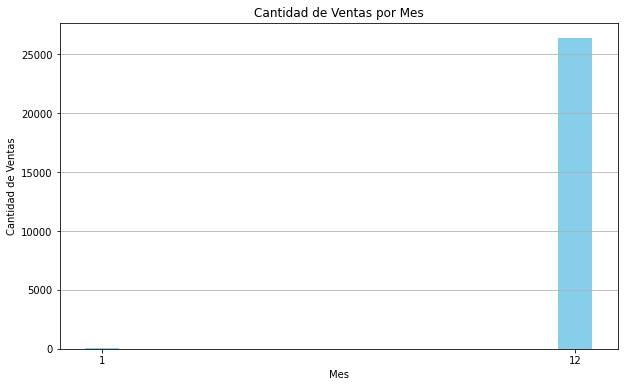

In [0]:

# Convertir a Pandas
ventas_por_mes_pd = ventas_por_mes.toPandas()

# Esto mostrará cuántos nulos hay en cada columna
ventas_por_mes_pd.isnull().sum()  

# Crear el histograma
plt.figure(figsize=(10, 6))
plt.bar(ventas_por_mes_pd["Mes"], ventas_por_mes_pd["Cantidad Ventas"], color='skyblue')
plt.title('Cantidad de Ventas por Mes')
plt.xlabel('Mes')
plt.ylabel('Cantidad de Ventas')
plt.xticks(ventas_por_mes_pd["Mes"])  # Mostrar todos los meses
plt.grid(axis='y')
plt.show()



####4.8.- Presente un resumen estadístico del dataframe (1pts)
### Instale pretty table para que se vea mas bonita la interfaz

In [0]:
from prettytable import PrettyTable
# Obtener el resumen estadístico
resumen_estadistico = DFVentas03_cleaned.describe()

# Crear una tabla PrettyTable
tabla = PrettyTable()

# Obtener nombres de columnas del resumen estadístico
column_names = resumen_estadistico.columns

# Agregar nombres de columnas a la tabla
tabla.field_names = column_names

# Agregar filas a la tabla
for row in resumen_estadistico.collect():
    tabla.add_row(row)

# Imprimir la tabla
print(tabla)

+---------+--------------------+-----------------------+--------------------+-------------------+--------------------+------------------+----------------------+
| summary |      ID Orden      |        Producto       |      Cantidad      |  Precio_Unitario  |        Mes         |    Dirección     | Ciudad(Departamento) |
+---------+--------------------+-----------------------+--------------------+-------------------+--------------------+------------------+----------------------+
|  count  |       24004        |         24004         |       24004        |       24004       |       24004        |      24004       |        24004         |
|   mean  | 287922.97446258954 |          None         | 1.100066655557407  | 334677.8102816197 | 11.984877520413264 |       None       |         None         |
|  stddev | 6685.734887157174  |          None         | 0.3821649809055632 | 538779.0320555507 | 0.4075849688198746 |       None       |         None         |
|   min   |       276339       | A

####4.9.- Se requiere presentar la cantidad de ventas por Ciudad(Departamento) y hacer un histograma (8pts).

In [0]:
# Calcular total de ventas por ciudad
ventas_por_ciudad = DFVentas03_cleaned.groupBy('Ciudad(Departamento)').sum('Cantidad')

# Renombrar la columna de suma
ventas_por_ciudad = ventas_por_ciudad.withColumnRenamed('sum(Cantidad)', 'Cantidad Ventas')

# Mostrar los resultados (opcional)
ventas_por_ciudad.show()

# Encontrar la ciudad con más ventas
ciudad_mas_vendida_row = ventas_por_ciudad.orderBy(ventas_por_ciudad['Cantidad Ventas'].desc()).first()
ciudad_mas_vendida = ciudad_mas_vendida_row['Ciudad(Departamento)']
ventas_ciudad_mas_vendida = ciudad_mas_vendida_row['Cantidad Ventas']

# Calcular el total de ventas
total_ventas_row = DFVentas03_cleaned.select('Cantidad').groupBy().sum().first()
total_ventas = total_ventas_row[0]




+--------------------+---------------+
|Ciudad(Departamento)|Cantidad Ventas|
+--------------------+---------------+
|         Cúcuta( NS)|           3557|
|   Barranquilla( AT)|           1439|
|           Cali( VC)|           2080|
|          Neiva( HU)|            347|
|    Bucaramanga( SA)|           1372|
|         Bogotá( CU)|           2840|
|        Armenia( QU)|           4184|
|       Medellin( AN)|           6378|
|      Manizalez( CA)|           2089|
|         Ibagué( TO)|           2120|
+--------------------+---------------+



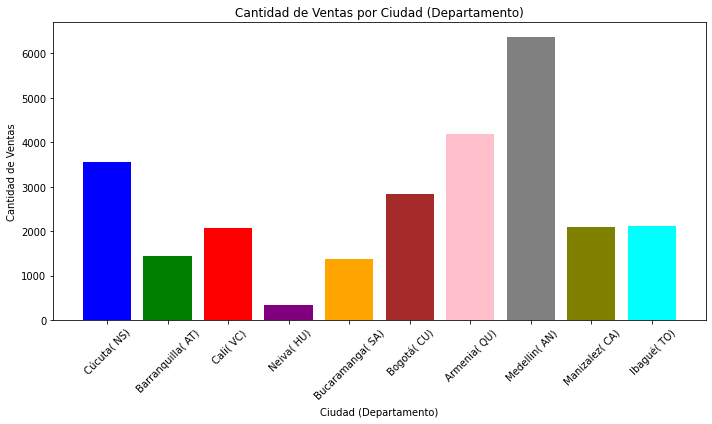

In [0]:

# Convertir a Pandas
ventas_por_ciudad_pd = ventas_por_ciudad.toPandas()

# Lista de colores (puedes agregar más si tienes más ciudades)
colores = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'olive', 'cyan']

# Crear el histograma con colores distintos para cada barra
plt.figure(figsize=(10, 6))
plt.bar(ventas_por_ciudad_pd['Ciudad(Departamento)'], 
        ventas_por_ciudad_pd['Cantidad Ventas'], 
        color=colores[:len(ventas_por_ciudad_pd)])  # Aplica diferentes colores

plt.xlabel('Ciudad (Departamento)')
plt.ylabel('Cantidad de Ventas')
plt.title('Cantidad de Ventas por Ciudad (Departamento)')
plt.xticks(rotation=45)
plt.tight_layout()

# Mostrar el histograma
plt.show()


##5.-Responda justificando las siguientes preguntas (30 pts):
#### 5.1.- Escriba 5 observaciones de la gráfica *4.7* (10 pts)


1. Pico de ventas en diciembre: El mayor número de ventas ocurre en el mes 12 (diciembre), superando las 24,000 ventas, mientras que en otros meses apenas hay actividad.

2. Desbalance en las ventas: Hay una gran disparidad en la cantidad de ventas entre los meses. Solo diciembre muestra una cifra significativa, mientras que en el mes 1 las ventas son muy bajas. Esto puede deberse a que hay errores en el dataset ya que pecisamente es del mes de Diciembre

3. Posible estacionalidad: Esta concentración de ventas en diciembre podría indicar una tendencia estacional, posiblemente relacionada con eventos como promociones o fiestas de fin de año. Se deberia revisar otros dataframes para llegar a este resultado.

4. Escala de ventas: La gráfica está medida en miles de ventas, con intervalos en el eje Y que van desde 0 hasta 25,000. Debido a eliminaciones de valores nulos, puede que el numero de ventas se haya reducido.

5. Presencia de mes de enero: Este tipo de anomalía puede distorsionar los análisis y las conclusiones sobre la estacionalidad o tendencias.

#### 5.2.-¿Cúal fue la ciudad que más productos vendió? (5 pts)

In [0]:
print("La ciudad que más vendió es: {} con {} ventas.".format(ciudad_mas_vendida, ventas_ciudad_mas_vendida))

La ciudad que más vendió es:  Medellin( AN) con 6378 ventas.


### Medellín
La ciudad que más vendió, teniendo en cuenta la gráfica, fue **Medellín** .





#### 5.3.-¿Cúal es el producto más vendido? (5 pts)


###AAA Batteries (4-pack)

In [0]:
# Calcular total de ventas por producto
ventas_por_producto = DFVentas03_cleaned.groupBy('Producto').sum('Cantidad')

# Renombrar la columna de suma
ventas_por_producto = ventas_por_producto.withColumnRenamed('sum(Cantidad)', 'Cantidad Vendida')

# Encontrar el producto más vendido
producto_mas_vendido_row = ventas_por_producto.orderBy(ventas_por_producto['Cantidad Vendida'].desc()).first()
producto_mas_vendido = producto_mas_vendido_row['Producto']
cantidad_producto_mas_vendido = producto_mas_vendido_row['Cantidad Vendida']

# Imprimir resultados sin f-strings
print("El producto más vendido es: {} con {} unidades vendidas.".format(producto_mas_vendido, cantidad_producto_mas_vendido))

El producto más vendido es: AAA Batteries (4-pack) con 3596 unidades vendidas.


#### 5.4.-¿Cúal es el producto menos vendido? (5 pts)


###LG Lavadora 19Kg Inv WT19


In [0]:
# Calcular total de ventas por producto
ventas_por_producto = DFVentas03_cleaned.groupBy('Producto').sum('Cantidad')

# Renombrar la columna de suma
ventas_por_producto = ventas_por_producto.withColumnRenamed('sum(Cantidad)', 'Cantidad Vendida')

# Encontrar el producto menos vendido
producto_menos_vendido_row = ventas_por_producto.orderBy(ventas_por_producto['Cantidad Vendida'].asc()).first()
producto_menos_vendido = producto_menos_vendido_row['Producto']
cantidad_producto_menos_vendido = producto_menos_vendido_row['Cantidad Vendida']

# Imprimir resultados sin f-strings
print("El producto menos vendido es: {} con {} unidades vendidas.".format(producto_menos_vendido, cantidad_producto_menos_vendido))

El producto menos vendido es: LG Lavadora 19Kg Inv WT19 con 63 unidades vendidas.


###AA Batteries (4-pack)

#### 5.5.-¿Cúal es la proporción de ventas de la ciudad que más vendió productos? (5 pts)

In [0]:
# Calcular la proporción
proporcion = (ventas_ciudad_mas_vendida / total_ventas) * 100


print("La proporción de ventas de esta ciudad es: {:.2f}% del total de ventas.".format(proporcion))


La proporción de ventas de esta ciudad es: 24.15% del total de ventas.
